In [1]:
from mesh_dataset_utils import *
from mesh_experiment import Experiment
import trimesh

In [2]:
mesh = trimesh.load('meshes/Spikeyball1.stl')

In [3]:
mesh.show()

In [4]:
dataset, smooth = build_norms_dataset(mesh)

mut dif
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]

In [6]:
smooth.show()

In [10]:
dataset.keys()

dict_keys(['fourier', 'points', 'target'])

In [8]:
dataset['fourier'].shape

(42787, 100)

In [11]:
dataset['points'].shape

(42787, 6)

In [12]:
dataset['target'].shape

(42787, 36)

In [14]:
A0 = dataset['target'][0].reshape((6,6))

In [15]:
x0 = dataset['points'][0]

In [16]:
x0.dot(A0)

array([-0.75699579,  0.49222824,  0.42973099, -0.0419683 ,  0.96460354,
       -0.23144421])

In [17]:
y0 = np.concatenate((mesh.vertex_normals, mesh.vertices), axis=1)[0]

In [18]:
y0

array([-0.75699579,  0.49222824,  0.42973099, -0.0419683 ,  0.96460354,
       -0.23144421])

In [19]:
# LFFFGGGGGGGGGG

# Generate Datasets

In [2]:
MESH_DIR = 'meshes/Spikeyball1.stl'

In [3]:
mesh = trimesh.load(MESH_DIR)

In [4]:
# mesh.show()

In [5]:
dataset, smooth = build_norms_dataset(mesh, smooth_iter=10000, smooth_type='taubin')

In [6]:
smooth.show()

In [7]:
DATASET_NAME = 'spikey_1_taubin_10k'
np.savez(f'npz_train/{DATASET_NAME}', fourier=dataset['fourier'], points=dataset['points'], target=dataset['target'])

# Quick Exp

In [8]:
from sklearn.model_selection import train_test_split
from datetime import datetime
import torch
from MLP import MLP
from torch import nn


In [10]:
X = dataset['fourier']
y = dataset['target']

In [11]:
X.shape

(42787, 100)

In [12]:
y.shape

(42787, 36)

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=11)

In [35]:
batch_size = 1000
train_data = torch.utils.data.TensorDataset(torch.tensor(X_train).float(), torch.tensor(y_train).float())
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)

test_data = torch.utils.data.TensorDataset(torch.tensor(X_test).float(), torch.tensor(y_test).float())
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=True)

In [36]:
model = MLP(
            input_dim=X.shape[1],
            output_dim=y.shape[1],
            hidden_dim=512,
            n_layers=6,
            geometric_init=True,
            beta=True,
            sine=True,
            all_sine=True,
            skip=True,
            bn=True,
            dropout=0.0
            )

In [41]:
lr=1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()
epochs = 50
rand_inits = 3
now = datetime.now()

OUT_DIR = f'experiments/{now.strftime("%m_%d_%y_%H:%M:%S")}_{DATASET_NAME}'
model_info = {'experiment notes': 'first surface norms experiment'}

In [42]:
OUT_DIR

'experiments/04_14_23_15:27:13_spikey_1_taubin_10k'

In [43]:
exp = Experiment(model,
                    optimizer,
                    loss_fn,
                    train_loader,
                    test_loader,
                    epochs,
                    rand_inits,
                    OUT_DIR,
                    model_info,
                    rand_seed=11)

In [44]:
log = exp.run()

started training for 50 epochs
epoch 0 training loss: 0.9722536447885874 eval loss: 0.8145589828491211
epoch 5 training loss: 0.168268938322325 eval loss: 0.14829976856708527
epoch 10 training loss: 0.035100579261779785 eval loss: 0.03159076347947121
epoch 15 training loss: 0.025884223950875772 eval loss: 0.027945641428232193
epoch 20 training loss: 0.025388851359083846 eval loss: 0.02588883601129055
epoch 25 training loss: 0.024464499306034396 eval loss: 0.02547108754515648
epoch 30 training loss: 0.02430790984952772 eval loss: 0.02305218204855919
epoch 35 training loss: 0.023750269735181653 eval loss: 0.02271735481917858
epoch 40 training loss: 0.023141782026033144 eval loss: 0.023802166804671288
epoch 45 training loss: 0.022801755247889337 eval loss: 0.023650959134101868
started training for 50 epochs
epoch 0 training loss: 0.721517614416174 eval loss: 0.35606294870376587
epoch 5 training loss: 0.02954891887870995 eval loss: 0.02471264638006687
epoch 10 training loss: 0.027661236556

In [45]:
log

{'model': 'MLP(\n  (model): ModuleList(\n    (0): Linear(in_features=100, out_features=512, bias=True)\n    (1): Sine()\n    (2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)\n    (3): Linear(in_features=512, out_features=512, bias=True)\n    (4): Sine()\n    (5): LayerNorm((512,), eps=1e-05, elementwise_affine=True)\n    (6): Linear(in_features=512, out_features=512, bias=True)\n    (7): Sine()\n    (8): LayerNorm((512,), eps=1e-05, elementwise_affine=True)\n    (9): Linear(in_features=612, out_features=512, bias=True)\n    (10): Sine()\n    (11): LayerNorm((512,), eps=1e-05, elementwise_affine=True)\n    (12): Linear(in_features=512, out_features=512, bias=True)\n    (13): Sine()\n    (14): LayerNorm((512,), eps=1e-05, elementwise_affine=True)\n    (15): Linear(in_features=512, out_features=36, bias=True)\n  )\n)',
 'optimizer': 'Adam (\nParameter Group 0\n    amsgrad: False\n    betas: (0.9, 0.999)\n    capturable: False\n    eps: 1e-08\n    foreach: None\n    lr: 0.0001\n 

In [13]:
model = MLP(
            input_dim=X.shape[1],
            output_dim=y.shape[1],
            hidden_dim=512,
            n_layers=6,
            geometric_init=True,
            beta=True,
            sine=True,
            all_sine=True,
            skip=True,
            bn=True,
            dropout=0.0
            )

In [14]:
model.load_state_dict(torch.load('experiments/04_14_23_15:27:13_spikey_1_taubin_10k/run_2/best-model-parameters.pt'))

<All keys matched successfully>

In [15]:
inference_X = dataset['fourier']

In [16]:
preds = model(torch.tensor(inference_X).float())

In [17]:
preds.shape

torch.Size([42787, 36])

In [18]:
preds = preds.detach().numpy()

In [19]:
preds_mat = preds.reshape((-1, 6, 6))

In [20]:
preds_mat.shape

(42787, 6, 6)

In [21]:
sm_pts = dataset['points']

In [23]:
preds_mat[0]

array([[ 6.4587802e-02, -2.2577494e-03,  4.5144558e-04,  8.4545821e-02,
         3.9738417e-04,  4.5552850e-04],
       [ 3.6488622e-03,  6.3308388e-02, -4.7157705e-04,  4.9220026e-04,
         8.2676366e-02, -9.5273554e-04],
       [-1.8294156e-04, -5.4489076e-04,  6.6681892e-02,  2.4825335e-04,
        -8.8298321e-04,  8.3933070e-02],
       [ 6.2744036e-02, -2.1633059e-03,  3.2885373e-04,  8.3808422e-02,
         3.3922493e-04,  5.7147443e-04],
       [ 3.8108230e-03,  6.1105043e-02, -6.6617131e-04,  3.5087764e-04,
         8.2152605e-02, -1.1216104e-03],
       [-3.9786100e-05, -3.8531423e-04,  6.4382643e-02,  6.9272518e-04,
        -1.0418594e-03,  8.3446458e-02]], dtype=float32)

In [40]:
out = sm_pts[0].dot(preds_mat[0])[3:]

In [41]:
out.shape

(3,)

In [42]:
new_pts = np.zeros((sm_pts.shape[0], 3))
new_norms = np.zeros((sm_pts.shape[0], 3))

for i in range(sm_pts.shape[0]):
    new_pts[i,:] = sm_pts[i].dot(preds_mat[i])[3:]
    new_norms[i,:] = sm_pts[i].dot(preds_mat[i])[:3]
    

In [43]:
new_pts.shape

(42787, 3)

In [44]:
smooth.vertices.shape

(42787, 3)

In [45]:
smooth.show()

In [48]:
smooth.vertices = new_norms

In [49]:
smooth.show()

In [74]:
import numpy as np
from scipy.spatial import Delaunay

# Example input data (replace with your own points and normals)
points = new_pts
normals = new_norms

# Triangulate points

tri = Delaunay(points, qhull_options='QJ')  # Only use the x-y coordinates for triangulation

# Step 3: Orient triangles based on normals
dot_products = np.sum(normals[tri.simplices][:, :, np.newaxis] * normals[tri.simplices][:, np.newaxis, :], axis=3)
tri.simplices = tri.simplices[np.where(dot_products < 0)[0]][:, ::-1]

# Step 4: Create mesh data structure
vertices = points
faces = tri.simplices

In [75]:
vertices.shape

(42787, 3)

In [76]:
faces.shape

(162, 4)

In [77]:
pred_with_norms = trimesh.Trimesh(vertices=vertices, faces=faces)

In [78]:
pred_with_norms.show()

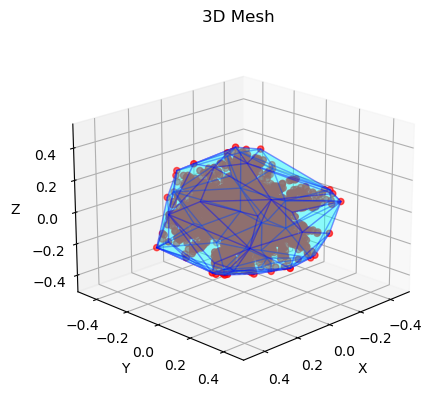

In [80]:
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# Generate random 3D points
np.random.seed(0)
points = new_pts

# Compute convex hull
hull = ConvexHull(points)

# Extract vertices and faces from convex hull
vertices = hull.points
faces = hull.simplices

# Plot 3D mesh
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Mesh')
ax.scatter(vertices[:, 0], vertices[:, 1], vertices[:, 2], c='r', marker='o')
mesh = Poly3DCollection(vertices[faces], alpha=.25, facecolor='cyan', edgecolor='b')
ax.add_collection3d(mesh)
ax.view_init(elev=20, azim=45)
plt.show()
